# Setup

In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
import scanpy as sc
import seaborn as sns
import scrnatools as rna
import matplotlib.pyplot as plt
import scipy
import numpy as np
import pandas as pd
import math
from scipy.stats import ttest_ind
from scipy.stats import gaussian_kde
from scipy import sparse
import scvi
import celltypist
import os
import shutil
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize, LinearSegmentedColormap
import glob
import anndata as ad
from scipy.sparse import csr_matrix
from adjustText import adjust_text

In [3]:
%matplotlib inline

In [4]:
# Setup figure params
plt.rcParams["pdf.use14corefonts"] = True
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = "Arial"
sc.set_figure_params(dpi=80, dpi_save=600, facecolor="white", frameon=False)
sns.set_context("paper")
plt.rcParams["axes.grid"] = False
cmap = sns.color_palette("colorblind")
# Get the tab20 colormap
tab20_cmap = plt.get_cmap('tab20')

# Create a new colormap without the 7th and 8th colors
colors_to_exclude = [6, 7]  # 0-based index, so 6 and 7 represent the 7th and 8th colors
new_tab20 = [tab20_cmap(i) for i in range(tab20_cmap.N) if i not in colors_to_exclude]

In [5]:
scvi.settings.seed = 0

Global seed set to 0


# Data paths

In [6]:
rawDataPath = "/mnt/iacchus/joe/raw_data/"
processedDataPath = "/mnt/iacchus/joe/processed_data/"

# Load data

## Thymus data

In [9]:
thymus_data = sc.read(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/combined_all_genes_TECs_final.h5ad")
thymus_model = scvi.model.SCVI.load(
    f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/combined_all_genes",
    adata=thymus_data,
)

INFO     File /mnt/iacchus/joe/processed_data//Fezf2_thymus_paper/scVI_models/combined_all_genes/model.pt already  
         downloaded                                                                                                


INFO:2025-07-14 19:25:12,418:jax._src.xla_bridge:924: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
INFO:2025-07-14 19:25:12,497:jax._src.xla_bridge:924: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


## Lung

### Tiechmann

In [8]:
lung_data = pd.read_csv(f"{rawDataPath}epithelial_atlases/Respiratory_epithelium/GSE103354_Trachea_droplet_UMIcounts.txt", index_col=0, sep="\t")
lung_data = sc.AnnData(lung_data.T)
lung_data = lung_data[:, lung_data.var_names.isin(thymus_data.var_names)].copy()
lung_data.obs["cell_type"] = [i.split("_")[2] for i in lung_data.obs_names]
lung_data.obs["batch"] = [i.split("_")[0] for i in lung_data.obs_names]
lung_data.obs_names = [f"{i.split('_')[0]}_{i.split('_')[1]}" for i in lung_data.obs_names]
# Subset on WT samples
lung_data = lung_data[~lung_data.obs.batch.isin(["M5", "M6"])].copy()

### Injured lung

In [9]:
counts = pd.read_csv(f"{rawDataPath}epithelial_atlases/injured_lung/raw/GSE184384_influenza_timecourse_epithelial_counts.csv", index_col=0)
injured_lung = sc.AnnData(counts.T)
umap = pd.read_csv(f"{rawDataPath}epithelial_atlases/injured_lung/raw/GSE184384_influenza_timecourse_epithelial_umap.csv", index_col=0)
anno = pd.read_csv(f"{rawDataPath}epithelial_atlases/injured_lung/raw/GSE184384_influenza_timecourse_epithelial_anno.csv", index_col=0)
timepoint = pd.read_csv(f"{rawDataPath}epithelial_atlases/injured_lung/raw/GSE184384_influenza_timecourse_epithelial_timepoint.csv", index_col=0)
injured_lung.obs["cell_type"] = anno
injured_lung.obs["batch"] = timepoint
injured_lung = injured_lung[
    ~injured_lung.obs.batch.isin(["trachea", "naive"]),
    injured_lung.var_names.isin(thymus_data.var_names)
].copy()
injured_lung.obs.cell_type = injured_lung.obs.cell_type.replace({
    'Type II': "Inj_Type_II",
    'Type I': "Inj_Type_I",
    'Transitioning': "Inj_Trans",
    'Basal': "Inj_Basal",
    'Serous': "Inj_Serous",
    'Club': "Inj_Club",
    'Ciliated.1': "Inj_Ciliated_1",
    'Ciliated.2': "Inj_Ciliated_2"
}).astype("category")

### Combine

In [10]:
injured_lung = injured_lung[:, injured_lung.var_names.isin(lung_data.var_names)]
lung_data = lung_data[:, lung_data.var_names.isin(injured_lung.var_names)]

all_lung = ad.concat(
    [lung_data, injured_lung],
    index_unique="-",
    label="dataset",
    keys=["Normal", "Injured"]
)

### scVI

In [11]:
all_lung.layers["raw_counts"] = all_lung.X.copy()
sc.pp.normalize_total(all_lung, target_sum=1e4)
sc.pp.log1p(all_lung)
all_lung.layers["log1p"] = all_lung.X.copy()
all_lung.raw = all_lung

In [12]:
# sc.pp.highly_variable_genes(
#     all_lung,
#     flavor="seurat_v3",
#     n_top_genes=2000,
#     layer="raw_counts",
#     batch_key="batch",
#     subset=True,
# )

In [13]:
# Setup scVI model using raw counts and batch info
scvi.model.SCVI.setup_anndata(
    all_lung,
    layer="raw_counts",
    batch_key="batch",
)
all_lung_model = scvi.model.SCVI(all_lung)

In [14]:
# Train scVI model
all_lung_model.train(
    early_stopping=True,
    max_epochs=1000,
    accelerator="gpu",
    devices="auto" 
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 225/1000:  22%|██▎       | 225/1000 [07:17<25:06,  1.94s/it, v_num=1, train_loss_step=4.66e+3, train_loss_epoch=4.57e+3]
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 4698.708. Signaling Trainer to stop.


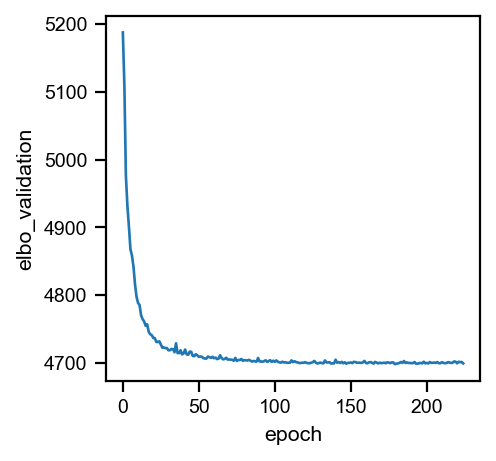

In [15]:
# Plot model ELBO
plt.figure(figsize=(3,3))
ax = sns.lineplot(all_lung_model.history['elbo_validation'])
plt.ylabel("elbo_validation")
ax.get_legend().remove()
plt.show()

In [16]:
# get scVI latent space and normalized expression
all_lung.obsm["X_scVI"] = all_lung_model.get_latent_representation()
all_lung.layers["scVI_normalized"] = all_lung_model.get_normalized_expression(library_size=1e4)

In [65]:
# Dimensionality reduction
sc.pp.neighbors(all_lung, use_rep="X_scVI")
sc.tl.umap(all_lung, random_state=42)

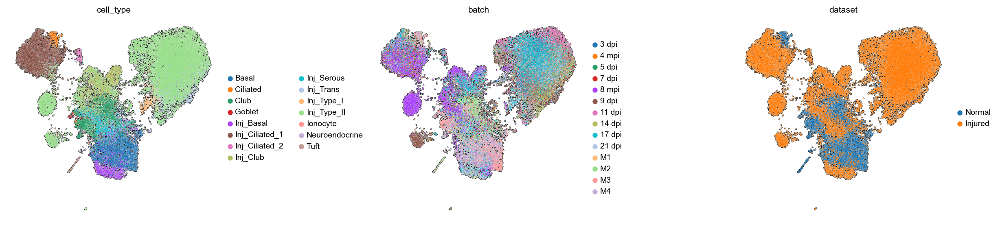

In [66]:
sc.settings.figdir = "../../analysis/lung_epithelial/"
sc.pl.umap(
    all_lung,
    color=["cell_type", "batch", "dataset"],
    # legend_loc="on data",
    s=5,
    add_outline=True,
    wspace=0.55,
    save="_lung_combined.pdf"
)

# Subcluster lung populations

In [19]:
thymus_subset_data = thymus_data[
    thymus_data.obs.subclustered.isin(["Goblet", "Lung, basal", "Ciliated", "Tuft1", "Tuft2", "Neuroendocrine"])
]

In [20]:
# New dimensionality reduction
sc.pp.neighbors(thymus_subset_data, use_rep="X_scVI")
sc.tl.umap(thymus_subset_data, random_state=42)

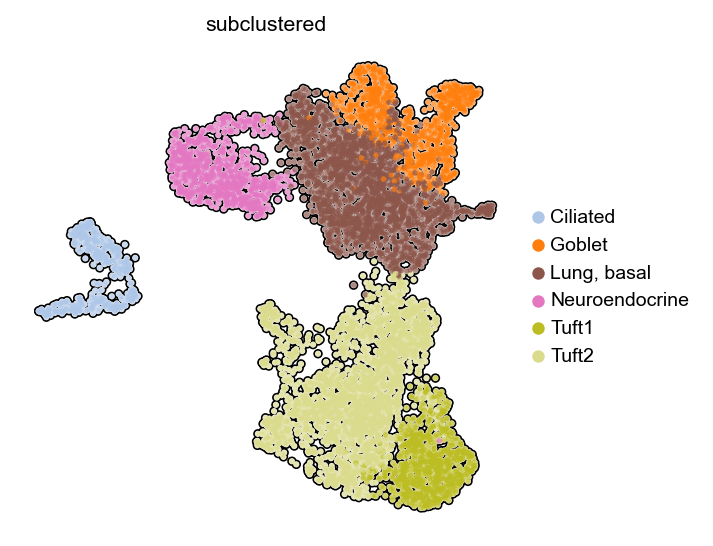

In [21]:
sc.pl.umap(
    thymus_subset_data,
    color="subclustered",
    s=25,
    add_outline=True
)

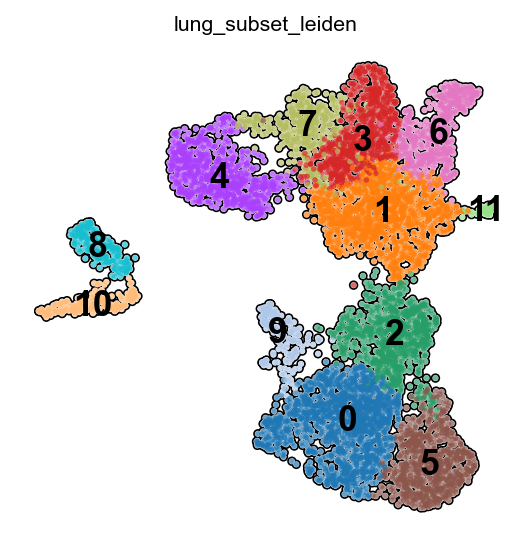

In [22]:
# Subclustering
sc.tl.leiden(thymus_subset_data, key_added="lung_subset_leiden", resolution=0.53)
sc.pl.umap(
    thymus_subset_data,
    color=["lung_subset_leiden"],
    s=25,
    add_outline=True,
    legend_loc="on data",
    legend_fontsize=16,
)

thymus_data.obs["lung_subset_leiden"] = thymus_subset_data.obs.lung_subset_leiden.astype(str)
thymus_data.obs.lung_subset_leiden = thymus_data.obs.lung_subset_leiden.fillna("non-lung").astype("category")

# Lung DE gene list scoring

## Run DE

In [23]:
lung_de_genes = all_lung_model.differential_expression(
    adata=all_lung,
    groupby="cell_type",
    silent=True,
)
lung_de_genes = lung_de_genes[lung_de_genes.bayes_factor > 2.5]
lung_de_genes = lung_de_genes[lung_de_genes.non_zeros_proportion1 > 0.05]
lung_de_genes = lung_de_genes[lung_de_genes.lfc_mean > 2]
lung_de_genes = lung_de_genes[lung_de_genes["is_de_fdr_0.05"]]
lung_de = {}
for cell_type in all_lung.obs.cell_type.unique():
    print(cell_type)
    print(lung_de_genes[lung_de_genes.group1 == cell_type].shape[0])
    lung_de[cell_type] = lung_de_genes[lung_de_genes.group1 == cell_type].sort_values(by="bayes_factor", ascending=False)

Club
228
Basal
597
Ciliated
1053
Tuft
743
Neuroendocrine
518
Goblet
231
Ionocyte
285
Inj_Type_II
165
Inj_Club
27
Inj_Trans
17
Inj_Serous
174
Inj_Basal
290
Inj_Type_I
276
Inj_Ciliated_1
1059
Inj_Ciliated_2
806


## Score cells

In [24]:
score_list = []
num_de_genes = 100

for cell_type, de_genes in lung_de.items():
    if cell_type not in [""]:
        print(cell_type)
        thymus_subset_data.X = thymus_subset_data.layers["log1p"]
        all_lung.X = all_lung.layers["log1p"]
        genes = de_genes.head(num_de_genes).index
        sc.tl.score_genes(thymus_subset_data, genes, score_name=f"{cell_type}_score", use_raw=False)
        sc.tl.score_genes(all_lung, genes, score_name=f"{cell_type}_score", use_raw=False)
        score_list.append(f"{cell_type}_score")

Club
Basal
Ciliated
Tuft
Neuroendocrine
Goblet
Ionocyte
Inj_Type_II
Inj_Club
Inj_Trans
Inj_Serous
Inj_Basal
Inj_Type_I
Inj_Ciliated_1
Inj_Ciliated_2


### Lung

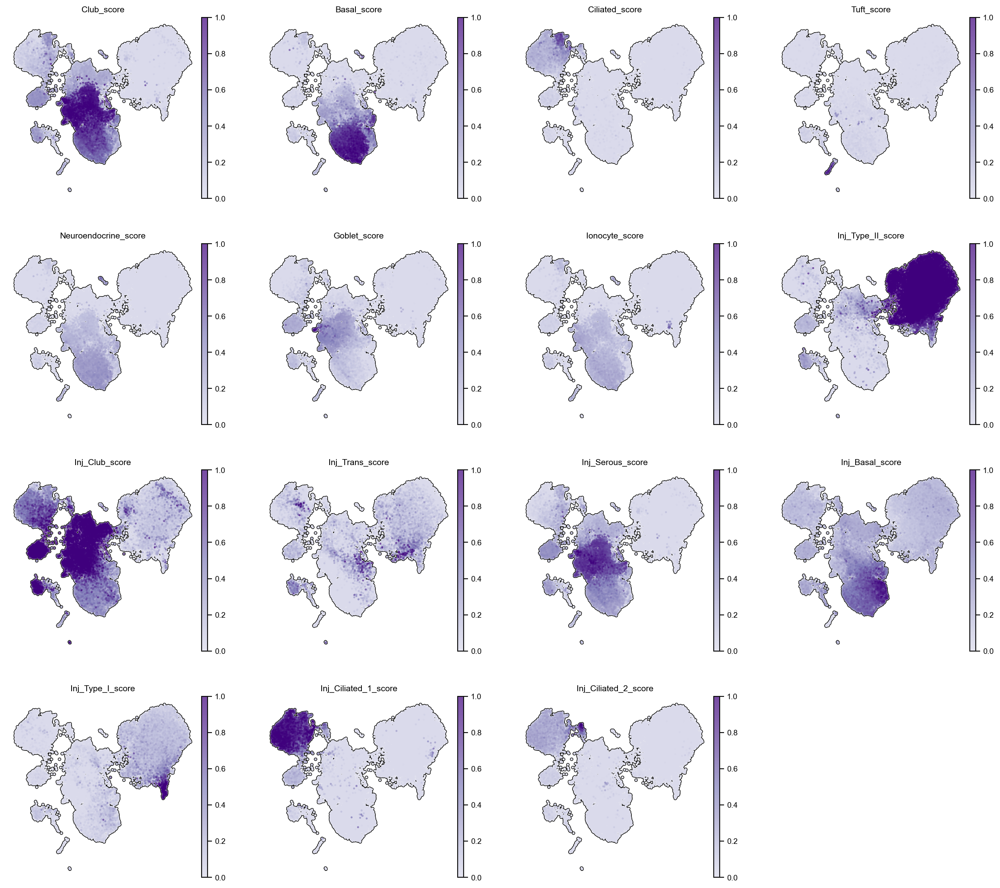

In [25]:
new_cmap = mcolors.LinearSegmentedColormap.from_list(
    "truncated", plt.cm.Purples(np.linspace(0.25, 1, 256))
)
sc.pl.umap(
    all_lung,
    color=score_list,
    vmin=0,
    vmax=1,
    cmap=new_cmap,
    s=20,
    add_outline=True
)

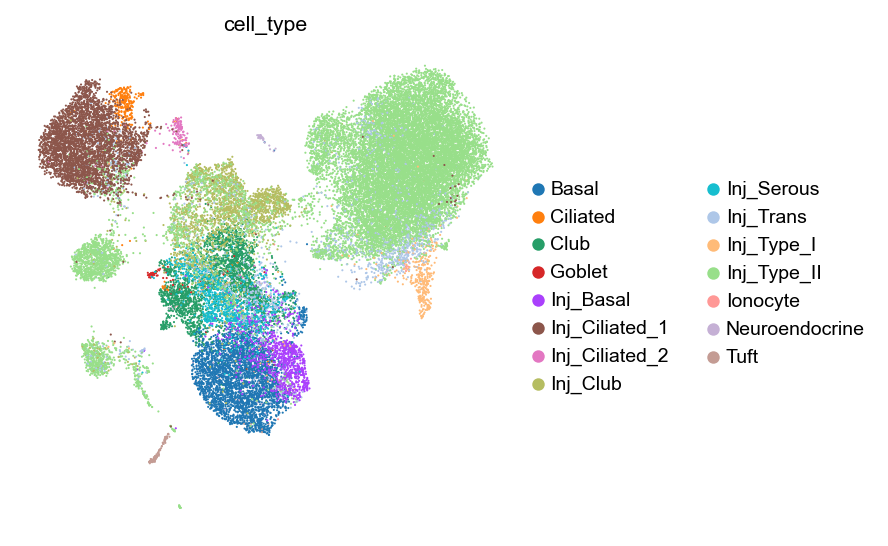

In [26]:
sc.pl.umap(all_lung, color="cell_type")

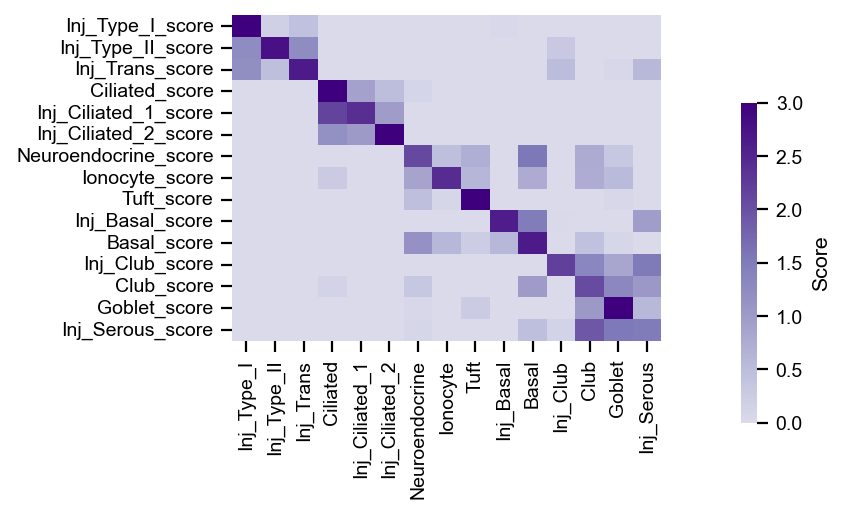

In [27]:
plot_data = all_lung.obs
plot_data = plot_data[["cell_type"]+score_list]
plot_data = plot_data.groupby("cell_type").mean()

order = [
    "Inj_Type_I", "Inj_Type_II", "Inj_Trans",
    "Ciliated", "Inj_Ciliated_1", "Inj_Ciliated_2",
    "Neuroendocrine", "Ionocyte", "Tuft",
    "Inj_Basal", "Basal",
    "Inj_Club", "Club",
    "Goblet", "Inj_Serous"
]
scores = [i+"_score" for i in order if i+"_score" in score_list]
plot_data = plot_data.loc[order, scores]
cg = sns.clustermap(
    plot_data.T,
    vmin=0,
    vmax=3,
    cmap=new_cmap,
    figsize=(5,4),
    row_cluster=False,
    col_cluster=False,
    z_score=0
)
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
cg.ax_heatmap.yaxis.tick_left()
cg.ax_heatmap.set_ylabel("")
cg.ax_heatmap.set_xlabel("")
cg.ax_cbar.set_position([0.8, 0.2, 0.02, 0.5])
cg.ax_cbar.set_ylabel("Score")
plt.savefig("../../analysis/lung_epithelial/lung_scoring.pdf", bbox_inches="tight")
plt.show()

### Thymus

WT


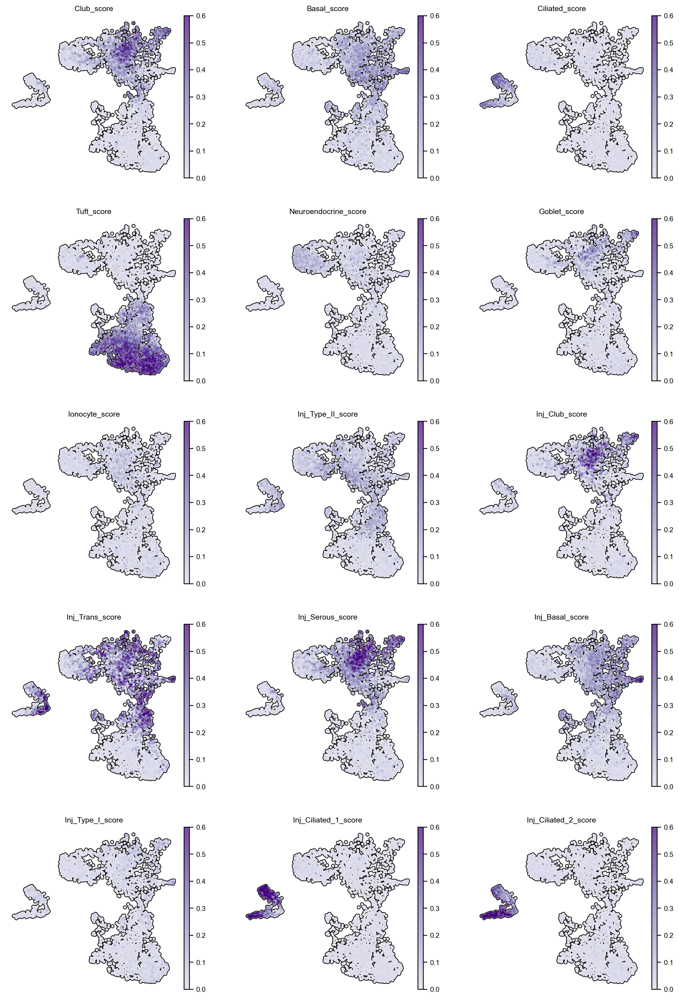

Fezf2 KO


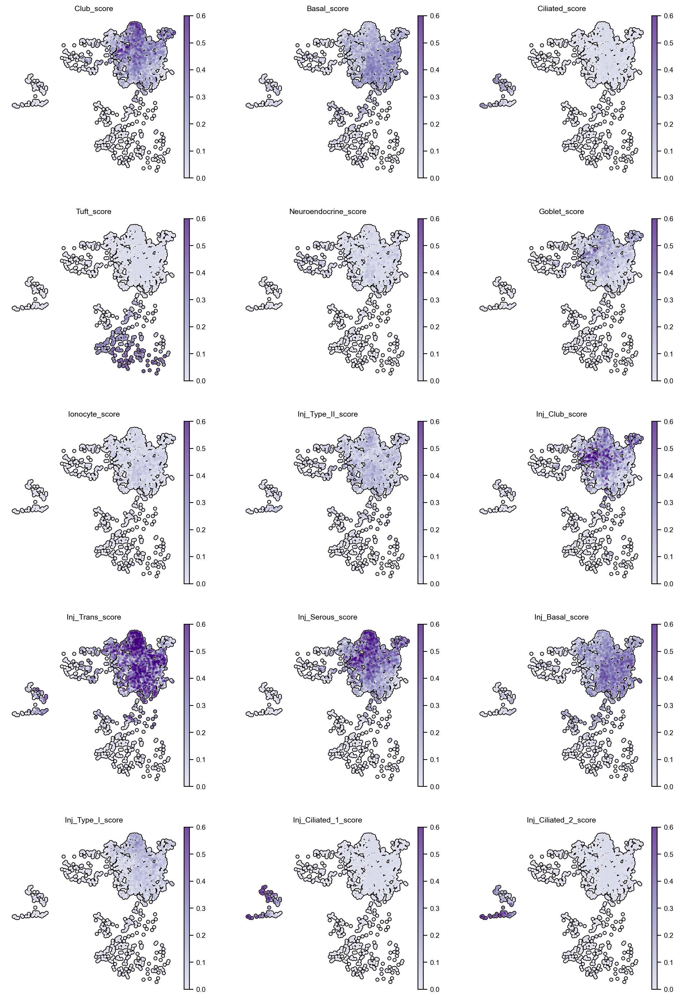

In [28]:
new_cmap = mcolors.LinearSegmentedColormap.from_list(
    "truncated", plt.cm.Purples(np.linspace(0.25, 1, 256))
)
print("WT")
sc.pl.umap(
    thymus_subset_data[thymus_subset_data.obs.genotype=="WT"],
    color=score_list,
    vmin=0,
    vmax=0.6,
    cmap=new_cmap,
    s=35,
    add_outline=True,
    ncols=3
)
print("Fezf2 KO")
sc.pl.umap(
    thymus_subset_data[thymus_subset_data.obs.genotype=="Fezf2_KO"],
    color=score_list,
    vmin=0,
    vmax=0.6,
    cmap=new_cmap,
    s=35,
    add_outline=True,
    ncols=3
)

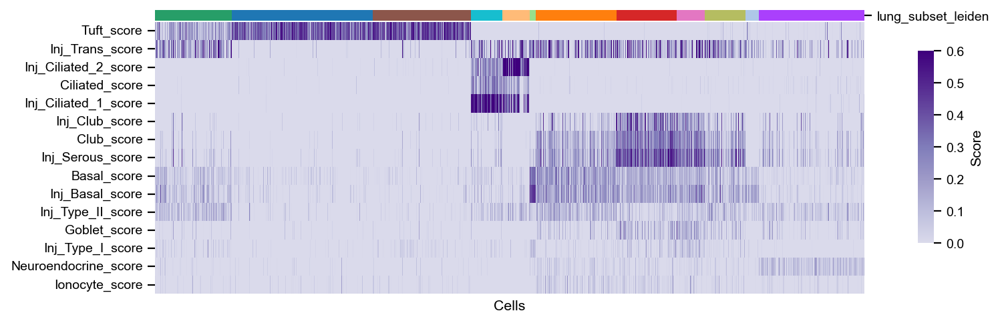

In [29]:
plot_data = thymus_subset_data[thymus_subset_data.obs.genotype=="WT"].obs
plot_data = plot_data[["lung_subset_leiden"] + score_list].copy()
plot_data.lung_subset_leiden = plot_data.lung_subset_leiden.cat.reorder_categories(["2", "0", "5", "8", "10", "11", "1", "3", "6", "7", "9", "4"])
plot_data = plot_data.sort_values(by="lung_subset_leiden")
del plot_data["lung_subset_leiden"]
lut = dict(zip(thymus_subset_data.obs.lung_subset_leiden.cat.categories.tolist(), thymus_subset_data.uns["lung_subset_leiden_colors"]))
col_colors = thymus_subset_data[thymus_subset_data.obs.genotype=="WT"].obs.lung_subset_leiden.map(lut)
cg = sns.clustermap(
    plot_data.T,
    vmin=0,
    vmax=0.6,
    cmap=new_cmap,
    figsize=(10,6),
    col_colors=col_colors,
    col_cluster=False
)
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
cg.ax_heatmap.yaxis.tick_left()
cg.ax_heatmap.set_ylabel("")
cg.ax_heatmap.set_xlabel("")
cg.ax_cbar.set_position([0.9, 0.5, 0.015, 0.3])
cg.ax_cbar.set_ylabel("Score")
cg.ax_heatmap.set_xticks([])
cg.ax_heatmap.set_xlabel("Cells")
plt.show()

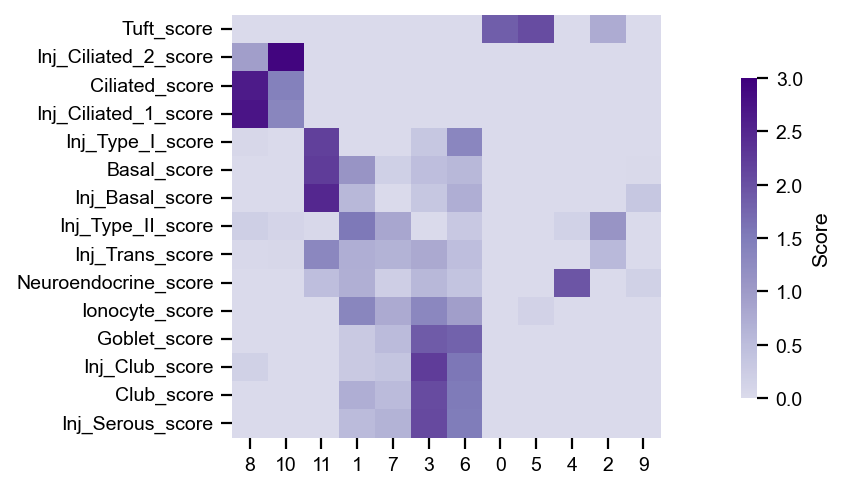

In [30]:
plot_data = thymus_subset_data[thymus_subset_data.obs.genotype=="WT"].obs
plot_data = plot_data[["lung_subset_leiden"]+score_list]
plot_data = plot_data.groupby("lung_subset_leiden").mean()
cg = sns.clustermap(
    plot_data.T,
    vmin=0,
    vmax=3,
    cmap=new_cmap,
    figsize=(5,4),
    z_score=0
)
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
cg.ax_heatmap.yaxis.tick_left()
cg.ax_heatmap.set_ylabel("")
cg.ax_heatmap.set_xlabel("")
cg.ax_cbar.set_position([0.8, 0.2, 0.02, 0.5])
cg.ax_cbar.set_ylabel("Score")
plt.show()

# Thymus subset DE genes

In [31]:
thymus_de_genes = thymus_model.differential_expression(
    adata=thymus_subset_data[thymus_subset_data.obs.genotype=="WT"],
    groupby="lung_subset_leiden",
    silent=True,
)
thymus_de_genes = thymus_de_genes[thymus_de_genes.bayes_factor > 2.5]
thymus_de_genes = thymus_de_genes[thymus_de_genes.non_zeros_proportion1 > 0.05]
thymus_de_genes = thymus_de_genes[thymus_de_genes.lfc_mean > 2]
thymus_de_genes = thymus_de_genes[thymus_de_genes["is_de_fdr_0.05"]]
thymus_de = {}
for cell_type in thymus_subset_data.obs.lung_subset_leiden.unique():
    thymus_de[cell_type] = thymus_de_genes[thymus_de_genes.group1 == cell_type].sort_values(by="lfc_mean", ascending=False)

INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


## TFs

In [32]:
tfs = pd.read_csv("../../mouse_TFs.csv", header=None)[0].tolist()
subset_tfs = {}
de_tfs = []
for cell_type, de in thymus_de.items():
    subset_tfs[cell_type] = [i for i in de.index if i in tfs]
    de_tfs += [i for i in de.index if i in tfs]
de_tfs = list(set(de_tfs))

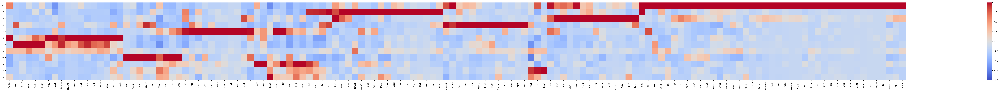

In [33]:
rna.pl.gene_heatmap(
    thymus_subset_data[thymus_subset_data.obs.genotype == "WT"],
    gene_list=de_tfs,
    obs_key="lung_subset_leiden",
    z_score=1,
    cmap="coolwarm",
    vmin=-2,
    vmax=2
)

# Keratins across subsets

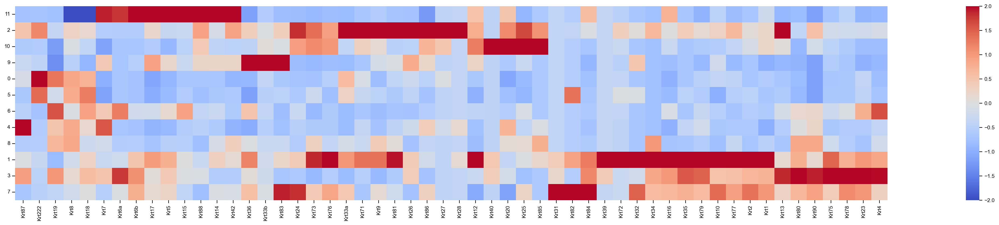

In [34]:
keratins = [i for i in thymus_subset_data.var_names if i.startswith("Krt") and i[3] != "a" and i[3] != "c" and i[3] != "d"]
rna.pl.gene_heatmap(
    thymus_subset_data[thymus_subset_data.obs.genotype == "WT"],
    gene_list=keratins,
    obs_key="lung_subset_leiden",
    z_score=1,
    cmap="coolwarm",
    vmin=-2,
    vmax=2
)

# Chemokines across subsets

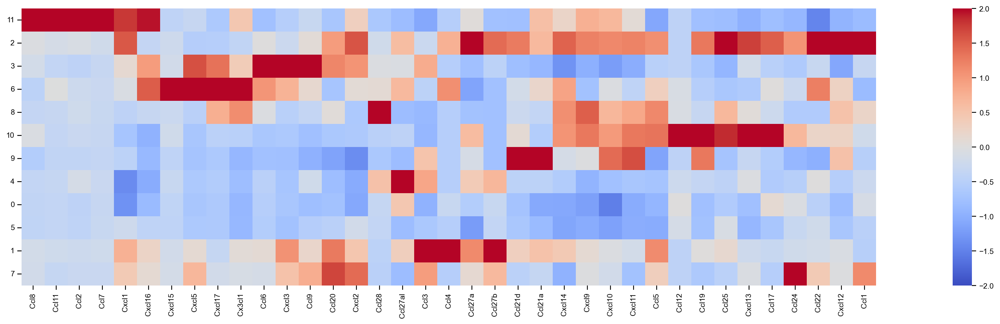

In [35]:
chemokines = [i for i in thymus_subset_data.var_names if i.startswith("Ccl") or i.startswith("Cxcl")]
for i in ["Cx3cl1"]:
    chemokines.append(i)
rna.pl.gene_heatmap(
    thymus_subset_data[thymus_subset_data.obs.genotype == "WT"],
    gene_list=chemokines,
    obs_key="lung_subset_leiden",
    z_score=1,
    cmap="coolwarm",
    vmin=-2,
    vmax=2
)

# Cell cycle

... storing 'phase' as categorical


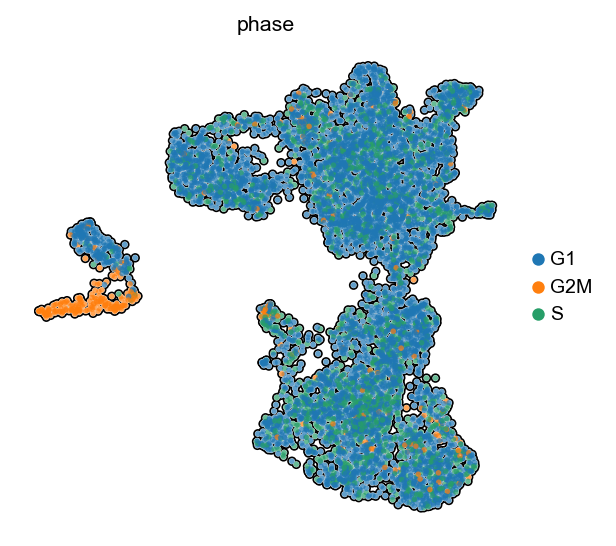

In [36]:
cell_cycle_genes = [
    "Mcm5", "Pcna", "Tyms", "Fen1", "Mcm2", "Mcm4", "Rrm1", "Ung", "Gins2", "Mcm6",
    "Cdca7", "Dtl", "Prim1", "Uhrf1", "Mlf1ip", "Hells", "Rfc2", "Rpa2", "Nasp", "Rad51ap1",
    "Gmnn", "Wdr76", "Slbp", "Ccne2", "Ubr7", "Pold3", "Msh2", "Atad2", "Rad51", "Rrm2",
    "Cdc45", "Cdc6", "Exo1", "Tipin", "Dscc1", "Blm", "Casp8ap2", "Usp1", "Clspn", "Pola1",
    "Chaf1b", "Brip1", "E2f8", "Hmgb2", "Cdk1", "Nusap1", "Ube2c", "Birc5", "Tpx2", "Top2a",
    "Ndc80", "Cks2", "Nuf2", "Cks1b", "Mki67", "Tmpo", "Cenpf", "Tacc3", "Fam64a", "Smc4",
    "Ccnb2", "Ckap2l", "Ckap2", "Aurkb", "Bub1", "Kif11", "Anp32e", "Tubb4b", "Gtse1", "Kif20b",
    "Hjurp", "Cdca3", "Hn1", "Cdc20", "Ttk", "Cdc25c", "Kif2c", "Rangap1", "Ncapd2", "Dlgap5",
    "Cdca2", "Cdca8", "Ect2", "Kif23", "Hmmr", "Aurka", "Psrc1", "Anln", "Lbr", "Ckap5",
    "Cenpe", "Ctcf", "Nek2", "G2e3", "Gas2l3", "Cbx5", "Cenpa"
]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
sc.tl.score_genes_cell_cycle(thymus_subset_data, s_genes=s_genes, g2m_genes=g2m_genes)
sc.settings.figdir = "../../analysis/lung_epithelial/"
sc.pl.umap(
    thymus_subset_data,
    color='phase',
    s=25,
    add_outline=True,
    save="_subclustered_phase.pdf"
)

# Reannotation

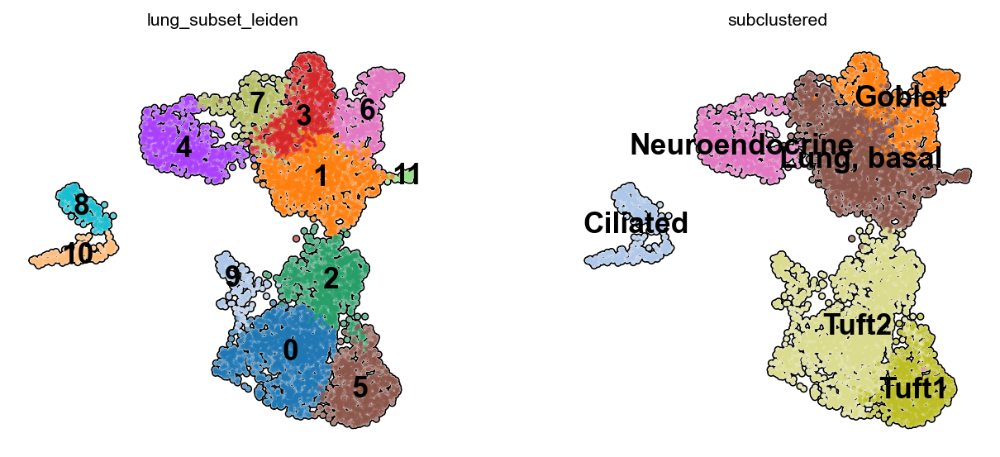

In [37]:
sc.settings.figdir = "../../analysis/lung_epithelial/"
sc.pl.umap(
    thymus_subset_data,
    color=["lung_subset_leiden", "subclustered"],
    s=25,
    add_outline=True,
    legend_loc="on data",
    legend_fontsize=16,
    save="_subclustered_original.pdf"
)

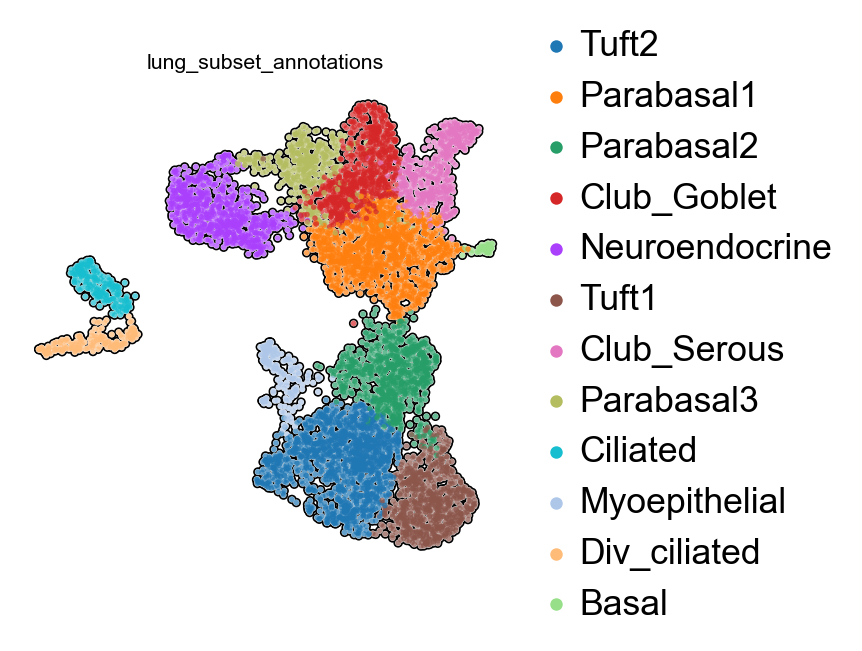

In [11]:
thymus_subset_data.obs["lung_subset_annotations"] = thymus_subset_data.obs.lung_subset_leiden.replace({
    "0": "Tuft2",
    "1": "Parabasal1",
    "2": "Parabasal2",
    "3": "Club_Goblet",
    "4": "Neuroendocrine",
    "5": "Tuft1",
    "6": "Club_Serous",
    "7": "Parabasal3",
    "8": "Ciliated",
    "9": "Myoepithelial",
    "10": "Div_ciliated",
    "11": "Basal"
})
sc.settings.figdir = "../../analysis/lung_epithelial/"
sc.pl.umap(
    thymus_subset_data,
    color=["lung_subset_annotations"],
    s=25,
    add_outline=True,
    legend_fontsize=16,
    save="_subclustered_annotated.pdf"
)
thymus_data.obs["lung_subset_annotations"] = thymus_subset_data.obs.lung_subset_annotations.astype(str)
thymus_data.obs.lung_subset_annotations = thymus_data.obs.lung_subset_annotations.fillna("non-lung")
thymus_data.obs.lung_subset_annotations = thymus_data.obs.lung_subset_annotations.astype("category")

## Scores

In [39]:
score_list

['Club_score',
 'Basal_score',
 'Ciliated_score',
 'Tuft_score',
 'Neuroendocrine_score',
 'Goblet_score',
 'Ionocyte_score',
 'Inj_Type_II_score',
 'Inj_Club_score',
 'Inj_Trans_score',
 'Inj_Serous_score',
 'Inj_Basal_score',
 'Inj_Type_I_score',
 'Inj_Ciliated_1_score',
 'Inj_Ciliated_2_score']

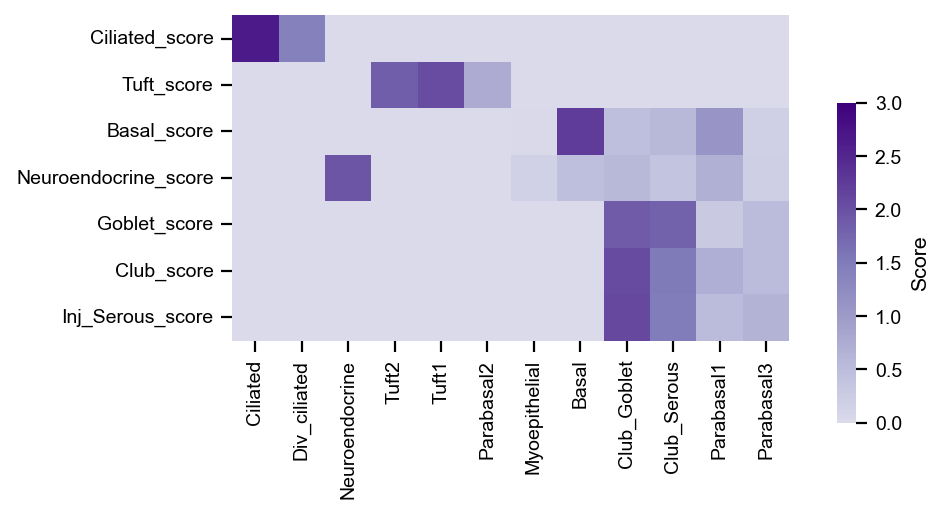

In [40]:
scores = [
    'Club_score',
    'Basal_score',
    'Ciliated_score',
    'Tuft_score',
    'Neuroendocrine_score',
    'Goblet_score',
    'Inj_Serous_score',
]
plot_data = thymus_subset_data[thymus_subset_data.obs.genotype=="WT"].obs
plot_data = plot_data[["lung_subset_annotations"]+scores]
plot_data = plot_data.groupby("lung_subset_annotations").mean()
cg = sns.clustermap(
    plot_data.T,
    vmin=0,
    vmax=3,
    cmap=new_cmap,
    figsize=(6,4),
    z_score=0
)
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
cg.ax_heatmap.yaxis.tick_left()
cg.ax_heatmap.set_ylabel("")
cg.ax_heatmap.set_xlabel("")
cg.ax_cbar.set_position([0.8, 0.2, 0.02, 0.5])
cg.ax_cbar.set_ylabel("Score")
plt.savefig("../../analysis/lung_epithelial/thymus_scoring.pdf", bbox_inches="tight")
plt.show()

## Marker genes

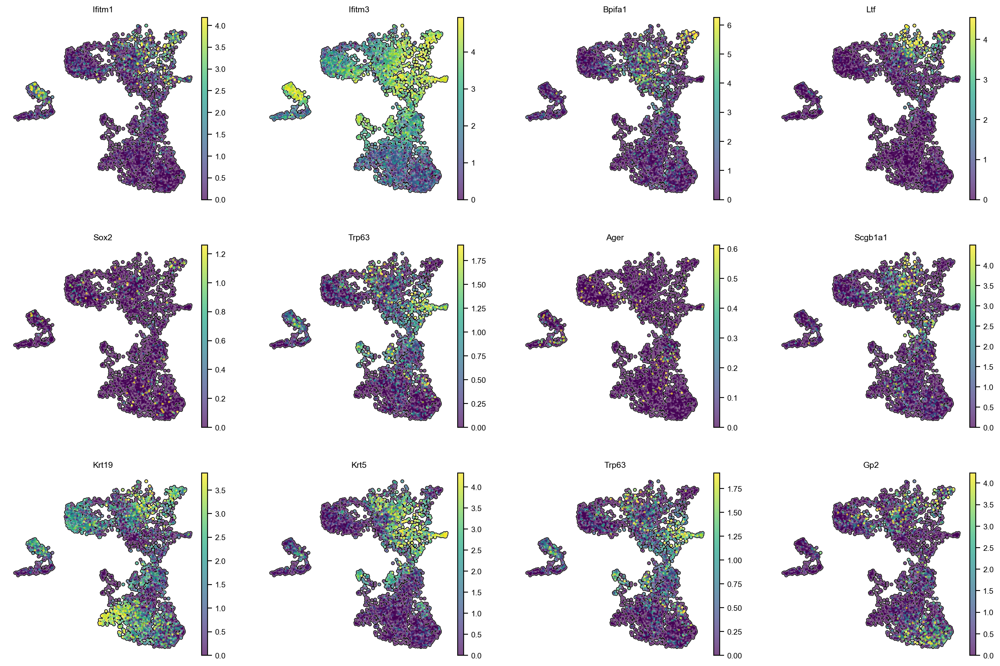

In [41]:
gene_list = thymus_de["6"].sort_values(by="lfc_mean", ascending=False).head(70).index
gene_list = ["Ifitm1", "Ifitm3", "Bpifa1", "Ltf", "Sox2", "Trp63", "Ager", "Scgb1a1", "Krt19",  "Krt5", "Trp63", "Gp2"]
layer="log1p"

exprs = rna.tl.get_expression_matrix(
    thymus_subset_data[thymus_subset_data.obs.genotype == "WT"],
    gene_data=layer
)
vmin=[]
vmax=[]
for gene in gene_list:
    vmin.append(np.quantile(exprs[gene], 0.01))
    vmax.append(np.quantile(exprs[gene], 0.99))
sc.pl.umap(
    thymus_subset_data[thymus_subset_data.obs.genotype == "WT"],
    color=gene_list,
    vmin=vmin,
    vmax=vmax,
    s=25,
    add_outline=True,
    layer=layer
)

In [42]:
# Krt15 Krt14 Krt5 Serpinb5 Ccl11 Ccl7, Trp63 Snai2  - 11
# Serpinb2 Cyp2a5 Spink5 Cxcl3 Krt16 Krt23 - 1
# Cxcl5 Scgb1a1 Scgb3a2 Muc5ac Muc5b Ltf, Spdef Six3 - 3
# Il13 Dppa3 Cxcl27a Cxcl19 Cyp26a1 - 2
# Ptprc Tslp Alox5 Nrgn, Irf7 Hivep2 Sox7 Sox9 Dclk1 Hoxa13 - 5
# Nrep Gnat3 Tas2r109 Tas2r120 Tas2r110 Ovol3, Ascl2 Satb2 - 0
# Actc1 Tpm2 Ccl21a Tubb2b Acta2 Serpinh1 Mdk, Hes6 Myog Myf6 Tead2 Ovol3 Mafa - 9
# Mki67 Ccdc192 Ccna1 Mcidas, Tbx1 E2f7 - 10
# Sntn Tmem212 Ccdc153, Foxj1 - 8
# Cd177 Chga, Insm1 Ascl1 - 4
# Erbb2 Rptn Tead3 - 7
# F3 Osr1 Pdpn Cxcl15 Cxcl17 Epas1 Igfbp7 Trf Bpifa1, Nfib Plscr2 - 6

# Pou2f3 - broad tuft
# Notch1 Notch2 Notch3 - differentiation

In [43]:
thymus_subset_data.obs.lung_subset_annotations.value_counts()

Tuft2             1310
Parabasal1        1224
Parabasal2         789
Club_Goblet        754
Neuroendocrine     726
Tuft1              692
Club_Serous        493
Parabasal3         405
Ciliated           199
Myoepithelial      176
Div_ciliated       175
Basal               43
Name: lung_subset_annotations, dtype: int64

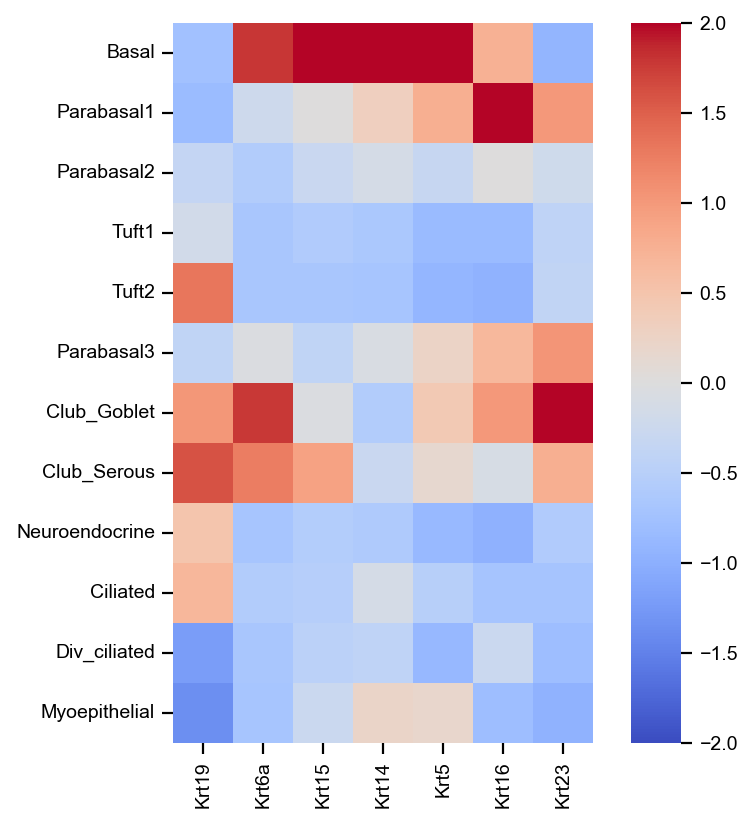

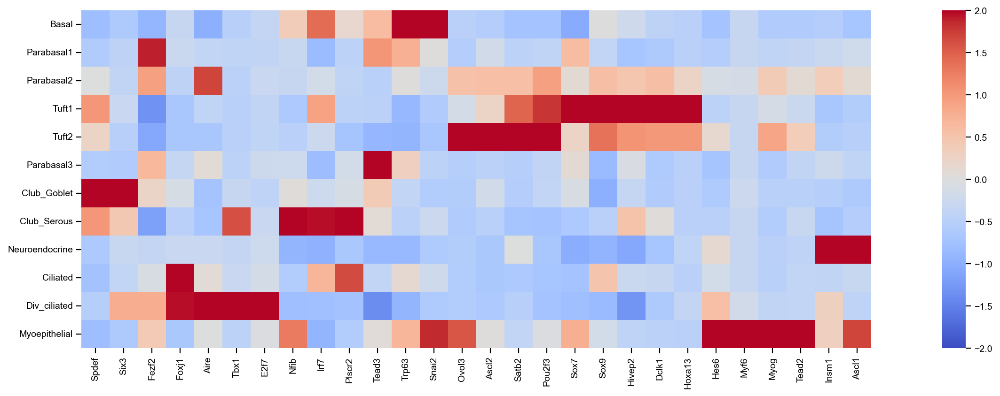

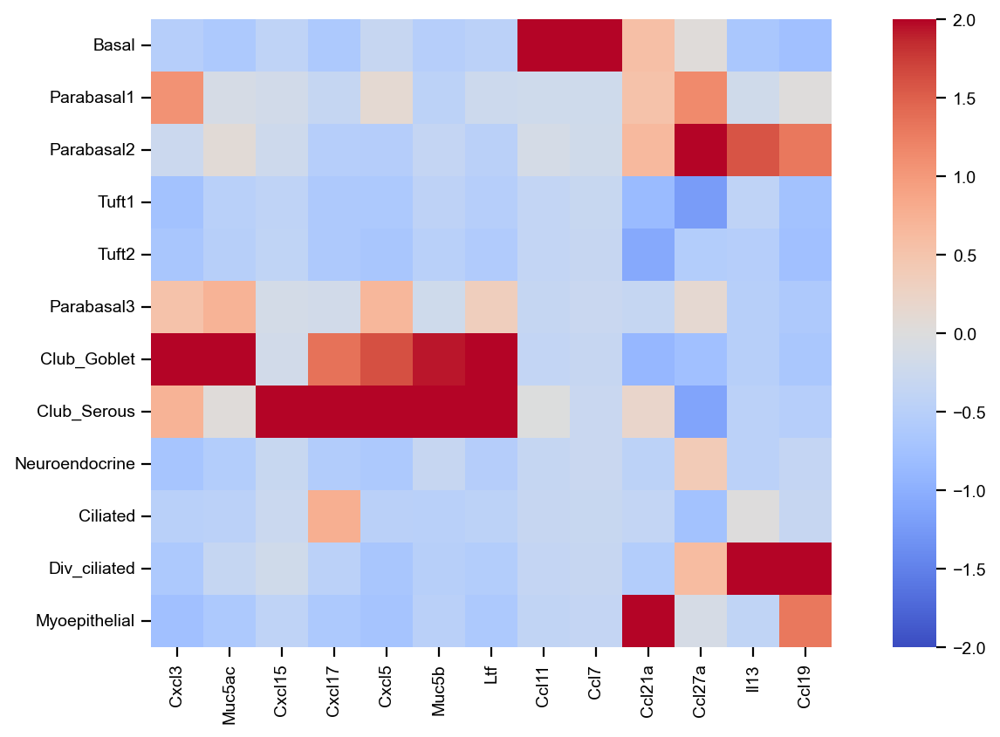

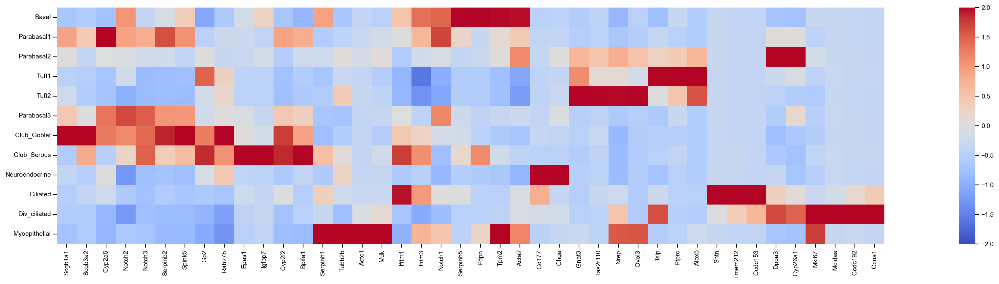

In [9]:
keratins = ["Krt15", "Krt14", "Krt5","Krt16", "Krt23","Krt19", "Krt6a"]
TFs = [
    "Trp63", "Snai2", "Spdef", "Six3", "Irf7", "Hivep2",
    "Sox7", "Sox9", "Dclk1", "Hoxa13", "Ascl2", "Satb2",
    "Hes6", "Myog", "Myf6", "Tead2", "Ovol3",
    "Tbx1", "E2f7", "Foxj1", "Insm1", "Ascl1", "Tead3",
    "Nfib", "Plscr2", "Pou2f3", "Aire", "Fezf2"
]
secreted = [
    "Ccl11", "Ccl7", "Cxcl3", "Cxcl5", "Muc5ac",
    "Muc5b", "Ltf", "Il13", "Ccl27a", "Ccl19",
    "Ccl21a", "Cxcl15", "Cxcl17",
]
others = [
    "Serpinb5", "Serpinb2", "Cyp2a5", "Spink5", "Scgb1a1",
    "Scgb3a2", "Dppa3", "Cyp26a1", "Ptprc", "Tslp",
    "Alox5", "Nrep", "Gnat3",
    "Tas2r110", "Ovol3", "Actc1", "Tpm2", "Tubb2b", "Acta2", 
    "Serpinh1", "Mdk", "Mki67", "Ccdc192", "Ccna1", "Mcidas",
    "Sntn", "Tmem212", "Ccdc153", "Cd177", "Chga",
    "Pdpn", "Epas1", "Igfbp7", "Gp2", "Rab27b", "Cyp2f2",
    "Bpifa1", "Notch1", "Notch2", "Notch3", "Ifitm1", "Ifitm3",
]
wt_data = thymus_subset_data[thymus_subset_data.obs.genotype == "WT"].copy()
wt_data.obs.lung_subset_annotations = wt_data.obs.lung_subset_annotations.cat.reorder_categories([
    "Basal",
    "Parabasal1",
    "Parabasal2",
    "Tuft1",
    "Tuft2",
    "Parabasal3",
    "Club_Goblet",
    "Club_Serous",
    "Neuroendocrine",
    "Ciliated",
    "Div_ciliated",
    "Myoepithelial"
])
rna.pl.gene_heatmap(
    wt_data,
    gene_list=keratins,
    obs_key="lung_subset_annotations",
    z_score=1,
    cmap="coolwarm",
    vmin=-2,
    vmax=2,
    row_cluster=False,
    save_path="../../analysis/lung_epithelial/keratins_heatmap.pdf"
)
rna.pl.gene_heatmap(
    wt_data,
    gene_list=TFs,
    obs_key="lung_subset_annotations",
    z_score=1,
    cmap="coolwarm",
    vmin=-2,
    vmax=2,
    row_cluster=False,
    save_path="../../analysis/lung_epithelial/TF_heatmap.pdf"
)
rna.pl.gene_heatmap(
    wt_data,
    gene_list=secreted,
    obs_key="lung_subset_annotations",
    z_score=1,
    cmap="coolwarm",
    vmin=-2,
    vmax=2,
    row_cluster=False,
    save_path="../../analysis/lung_epithelial/secreted_heatmap.pdf"
)
rna.pl.gene_heatmap(
    wt_data,
    gene_list=others,
    obs_key="lung_subset_annotations",
    z_score=1,
    cmap="coolwarm",
    vmin=-2,
    vmax=2,
    row_cluster=False,
    save_path="../../analysis/lung_epithelial/other_markers_heatmap.pdf"
)

# Abundance

/tmp/ipykernel_3637470/1439959498.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lung_subset_pct_up.subset = lung_subset_pct_up.subset.cat.remove_unused_categories()


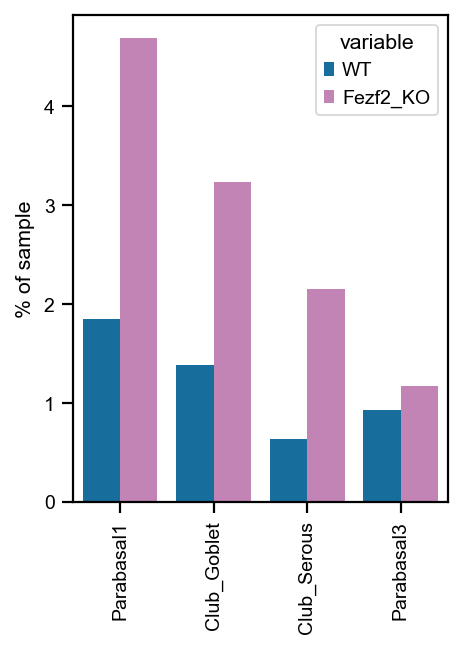

/tmp/ipykernel_3637470/1439959498.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lung_subset_pct_down.subset = lung_subset_pct_down.subset.cat.remove_unused_categories()


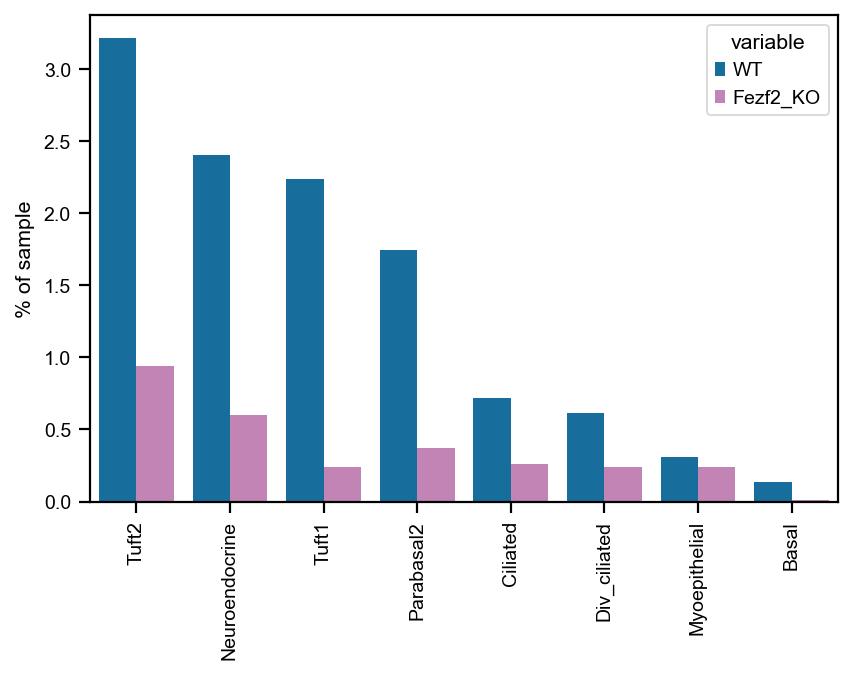

In [22]:
lung_subset_pct = {}
for genotype in ["WT", "Fezf2_KO"]:
    genotype_data = thymus_data[thymus_data.obs.genotype == genotype]
    lung_subset_pct[genotype] = genotype_data.obs.lung_subset_annotations.value_counts()/genotype_data.shape[0]*100

lung_subset_pct = pd.DataFrame(lung_subset_pct)
lung_subset_pct["subset"] = lung_subset_pct.index.astype("category")
lung_subset_pct = lung_subset_pct[lung_subset_pct.subset != "non-lung"]
lung_subset_pct.subset = lung_subset_pct.subset.cat.remove_unused_categories()
lung_subset_pct = lung_subset_pct.melt(id_vars="subset")

lung_subset_pct_up = lung_subset_pct[lung_subset_pct.subset.isin(["Parabasal3", "Parabasal1", "Club_Goblet", "Club_Serous"])]
lung_subset_pct_up.subset = lung_subset_pct_up.subset.cat.remove_unused_categories()
plt.figure(figsize=(0.75*4, 4))
sns.barplot(
    lung_subset_pct_up,
    x="subset",
    y="value",
    hue="variable",
    palette=[cmap[0], cmap[4]],
    order=["Parabasal1", "Club_Goblet", "Club_Serous", "Parabasal3"]
)
plt.xticks(rotation=90)
plt.xlabel("")
plt.ylabel("% of sample")
plt.savefig("../../analysis/lung_epithelial/subset_abundance_up.pdf", bbox_inches="tight")
plt.show()

lung_subset_pct_down = lung_subset_pct[~lung_subset_pct.subset.isin(["Parabasal3", "Parabasal1", "Club_Goblet", "Club_Serous"])]
lung_subset_pct_down.subset = lung_subset_pct_down.subset.cat.remove_unused_categories()
plt.figure(figsize=(0.75*len(lung_subset_pct_down.subset.unique()), 4))
sns.barplot(
    lung_subset_pct_down,
    x="subset",
    y="value",
    hue="variable",
    palette=[cmap[0], cmap[4]],
    order=["Tuft2", "Neuroendocrine", "Tuft1", "Parabasal2", "Ciliated", "Div_ciliated", "Myoepithelial", "Basal"]
)
plt.xticks(rotation=90)
plt.xlabel("")
plt.ylabel("% of sample")
plt.savefig("../../analysis/lung_epithelial/subset_abundance_down.pdf", bbox_inches="tight")
plt.show()

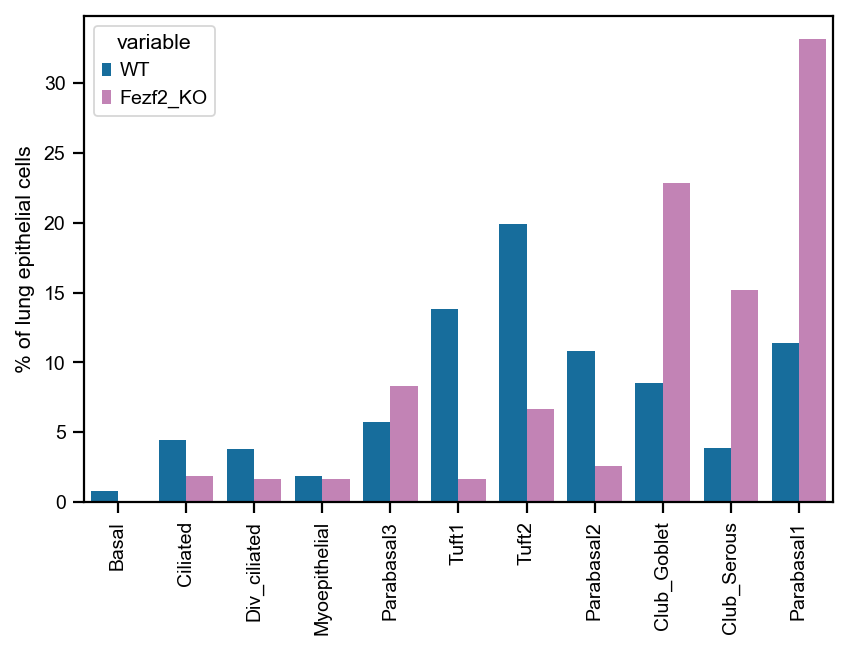

In [129]:
lung_subset_pct = {}
for genotype in ["WT", "Fezf2_KO"]:
    genotype_data = thymus_subset_data[thymus_subset_data.obs.genotype == genotype]
    lung_subset_pct[genotype] = genotype_data.obs.lung_subset_annotations.value_counts()/genotype_data.shape[0]*100

lung_subset_pct = pd.DataFrame(lung_subset_pct)
lung_subset_pct["subset"] = lung_subset_pct.index.astype("category")
lung_subset_pct = lung_subset_pct[lung_subset_pct.subset != "non-lung"]
lung_subset_pct.subset = lung_subset_pct.subset.cat.remove_unused_categories()
lung_subset_pct = lung_subset_pct.melt(id_vars="subset")
plt.figure(figsize=(6,4))
sns.barplot(
    lung_subset_pct,
    x="subset",
    y="value",
    hue="variable",
    palette=[cmap[0], cmap[4]],
    order=[
        "Basal", "Ciliated", "Div_ciliated", "Myoepithelial", "Parabasal3",
        "Tuft1", "Tuft2", "Parabasal2",
        "Club_Goblet", "Club_Serous", "Parabasal1",
    ]
)
plt.xticks(rotation=90)
plt.xlabel("")
plt.ylabel("% of lung epithelial cells")
plt.savefig("../../analysis/lung_epithelial/subset_abundance_of_lung_cells.pdf", bbox_inches="tight")
plt.show()

# Differential Density

In [47]:
thymus_subset_data.obs.genotype.value_counts()

WT          3715
Fezf2_KO    1832
Aire_KO     1439
Name: genotype, dtype: int64

In [48]:
target_cells = 1439

adatas = [thymus_subset_data[thymus_subset_data.obs.genotype.isin([genotype])] for genotype in thymus_subset_data.obs.genotype.cat.categories]

for dat in adatas:
    if dat.n_obs > target_cells:
         sc.pp.subsample(dat, n_obs=target_cells)

subset_downsampled = ad.concat(adatas)

## Fezf2 KO

In [49]:
subset_downsampled = rna.tl.log_density_ratio(
    subset_downsampled,
    group_by="genotype",
    groups=["WT", "Fezf2_KO"],
    key_added="Fezf2_KO/WT_genotype_density",
    latent_rep="X_umap",
)

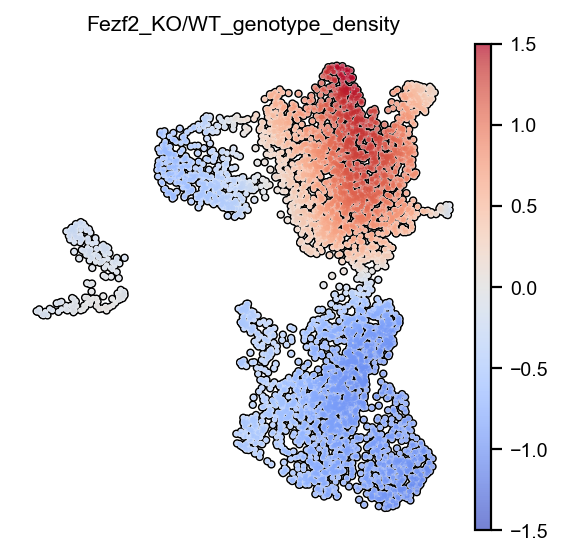

In [50]:
sc.settings.figdir = "../../analysis/lung_epithelial/"
sc.pl.umap(
    subset_downsampled,
    color="Fezf2_KO/WT_genotype_density",
    cmap="coolwarm",
    vmin=-1.5,
    vmax=1.5,
    add_outline=True,
    s=20,
    save="_Fezf2KO_density.pdf"
)

## Aire KO

In [51]:
subset_downsampled = rna.tl.log_density_ratio(
    subset_downsampled,
    group_by="genotype",
    groups=["WT", "Aire_KO"],
    key_added="Aire_KO/WT_genotype_density",
    latent_rep="X_umap",
)

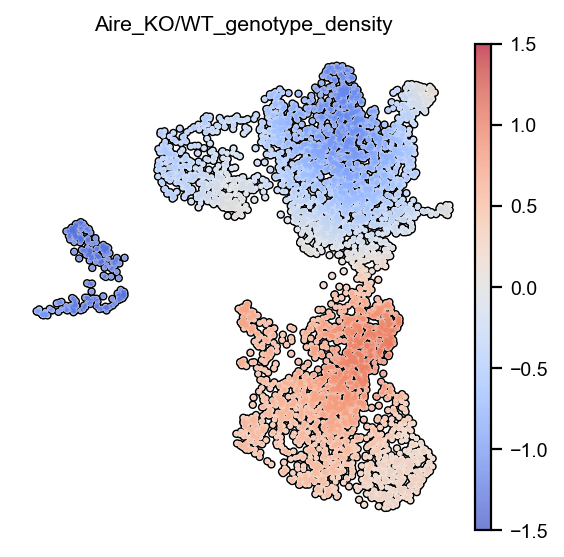

In [52]:
sc.settings.figdir = "../../analysis/lung_epithelial/"
sc.pl.umap(
    subset_downsampled,
    color="Aire_KO/WT_genotype_density",
    cmap="coolwarm",
    vmin=-1.5,
    vmax=1.5,
    add_outline=True,
    s=20,
    save="_AireKO_density.pdf"
)

# scVI DE WT vs KO

In [53]:
def scvi_cell_type_de(
    adata, 
    cell_type_key, 
    group_key, condition_group, control_group, 
    min_cells
):
    all_genes = pd.DataFrame()

    for cell_type in adata.obs[cell_type_key].unique():
        subset_data = adata[adata.obs[cell_type_key] == cell_type].copy()
        num_control = sum([i == control_group for i in subset_data.obs[group_key]])
        num_condition = sum([i == condition_group for i in subset_data.obs[group_key]])
        if num_control > min_cells and num_condition > min_cells:
            print(cell_type)
            de_genes = thymus_model.differential_expression(
                adata=subset_data,
                groupby=group_key,
                group2=condition_group,
                group1=control_group,
                silent=True,
            )
            de_genes["cell_type"] = cell_type
            all_genes = pd.concat([all_genes, de_genes])
        else:
            print(f"{cell_type} had too few cells in at least one group, skipping")

    all_genes["gene"] = all_genes.index
    all_genes.index = all_genes.index + "_" + all_genes.cell_type
    all_genes = all_genes.sort_index()
    all_genes["abs_lfc"] = abs(all_genes.lfc_mean)
    
    return all_genes

def filter_scvi_de_genes(
    adata, 
    df, 
    bayes_thresh, lfc_thresh, nonzero_thresh, 
    percentile, cell_type_key, expression_layer, peak_expression_thresh, 
    save_path=None,
    ylim=None, *args, **kwargs
):
    for cell_type in df.cell_type.unique():
        expression = rna.tl.get_expression_matrix(
            adata[adata.obs[cell_type_key] == cell_type],
            expression_layer
        )
        percentile_expression = pd.DataFrame(
            np.quantile(expression, percentile, axis=0),
            index=[f"{i}_{cell_type}" for i in expression.columns]
        )
        df.loc[percentile_expression.index, f"expression_{percentile}"] = percentile_expression[0]
    detected_genes = df[df[f"expression_{percentile}"] > peak_expression_thresh].copy()
    detected_genes = detected_genes[
        (detected_genes.non_zeros_proportion1 > nonzero_thresh) |
        (detected_genes.non_zeros_proportion2 > nonzero_thresh)
    ]
    
    ax = plt.scatter(
        x=detected_genes.lfc_mean,
        y=detected_genes.bayes_factor,
        s=1,
        rasterized=True,
        *args, **kwargs
    )
    plt.xlabel("lfc_mean")
    plt.ylabel("bayes_factor")
    plt.axhline(y=bayes_thresh, c="black")
    plt.axvline(x=lfc_thresh, c="black")
    plt.axvline(x=-1*lfc_thresh, c="black")
    if ylim is not None:
        plt.ylim(ylim)
    plt.tight_layout()
    if save_path is not None:
        plt.savefig(f"{save_path}", dpi=300)
    plt.show()
    
    filtered_genes = detected_genes[detected_genes.bayes_factor > bayes_thresh].copy()
    filtered_genes = filtered_genes[abs(filtered_genes.lfc_mean) > lfc_thresh]
    
    return detected_genes, filtered_genes

## Run DE

In [83]:
all_genes = {}
for sample in thymus_subset_data.obs["sample"].unique():
    subset_data = thymus_subset_data[thymus_subset_data.obs["sample"] == sample]
    for genotype in ["Fezf2"]:
        data = subset_data[subset_data.obs.batch.str.contains(genotype)]
        print(f"{genotype}-{sample}")
        all_gene = scvi_cell_type_de(
            adata=data,
            cell_type_key="lung_subset_annotations",
            group_key="genotype",
            condition_group=f"{genotype}_KO",
            control_group="WT",
            min_cells=10,
        )
        all_genes[f"{genotype}-{sample}"] = all_gene
        print()

Fezf2-1
Tuft2
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Neuroendocrine
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Parabasal3
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Tuft1
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Club_Goblet
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Div_ciliated
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Club_Serous
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Parabasal1
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                   

## Filter

Fezf2-1


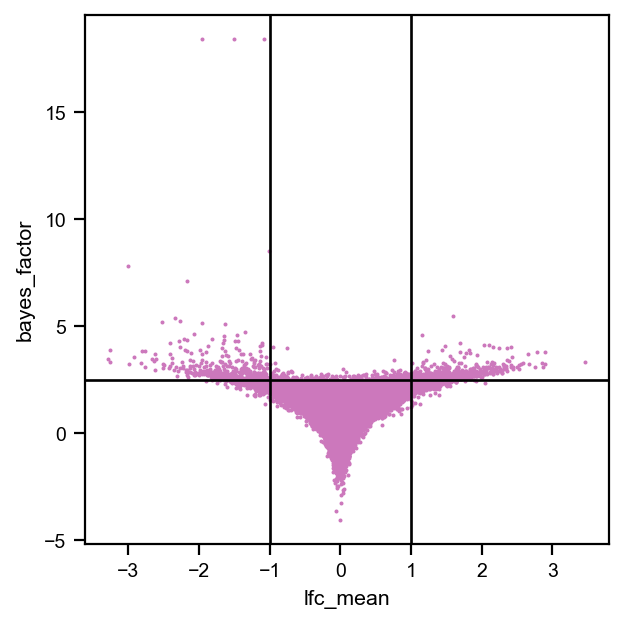

Fezf2-2


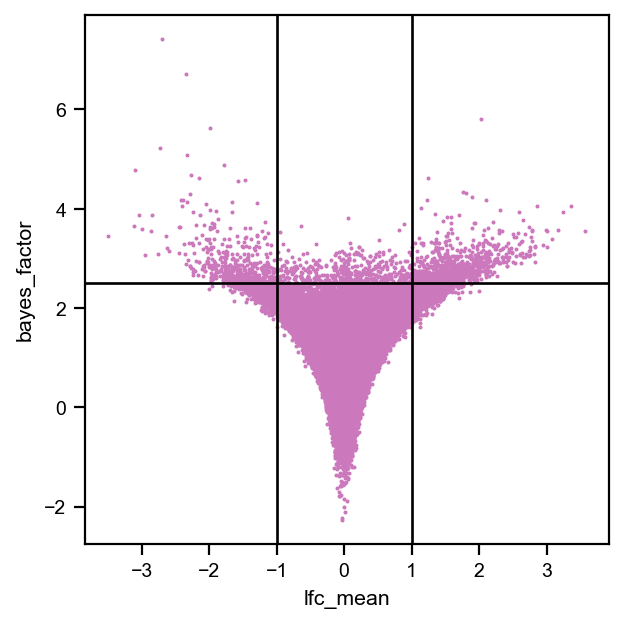

In [84]:
detected_genes = {}
filtered_genes = {}
for key, all_gene in all_genes.items():
    print(key)
    genotype, sample = key.split("-")
    if genotype == "Aire":
        color=cmap[1]
    else:
        color=cmap[4]
    subset_data = thymus_subset_data[
        thymus_subset_data.obs.batch.str.contains(genotype) 
        & (thymus_subset_data.obs["sample"] == sample)
    ]
    detected_gene, filtered_gene = filter_scvi_de_genes(
        adata=subset_data,
        cell_type_key="lung_subset_annotations",
        expression_layer="scVI_normalized",
        df=all_gene,
        bayes_thresh=2.5,
        lfc_thresh=1,
        nonzero_thresh=0.05,
        percentile=0.99,
        peak_expression_thresh=0.5,
        color=color,
        save_path=f"../../analysis/lung_subset_genotype_DE/{key}_filtering.pdf"
    )
    detected_genes[key] = detected_gene
    filtered_genes[key] = filtered_gene

## WT DE

In [85]:
all_genes_WT = {}
for genotype in ["Fezf2"]:
    data = thymus_subset_data[thymus_subset_data.obs.batch.str.contains(f"{genotype}_WT")]
    print(f"{genotype}")
    all_gene = scvi_cell_type_de(
        adata=data,
        cell_type_key="lung_subset_annotations",
        group_key="sample",
        condition_group="1",
        control_group="2",
        min_cells=30,
    )
    all_genes_WT[genotype] = all_gene
    print()

Fezf2
Tuft2
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Neuroendocrine
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Parabasal3
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Tuft1
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Club_Goblet
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Div_ciliated had too few cells in at least one group, skipping
Club_Serous had too few cells in at least one group, skipping
Parabasal1
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Parabasal2
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                          

Fezf2


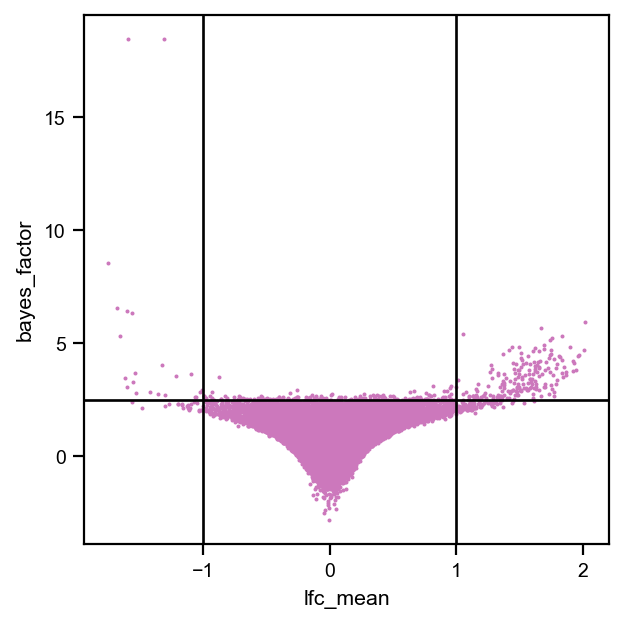

In [86]:
detected_genes_WT = {}
filtered_genes_WT = {}
for key, all_gene in all_genes_WT.items():
    print(key)
    if key == "Aire":
        color=cmap[1]
    else:
        color=cmap[4]
    subset_data = thymus_subset_data[thymus_subset_data.obs.batch.str.contains(f"{key}_WT")]
    detected_gene, filtered_gene = filter_scvi_de_genes(
        adata=subset_data,
        cell_type_key="lung_subset_annotations",
        expression_layer="scVI_normalized",
        df=all_gene,
        bayes_thresh=2.5,
        lfc_thresh=1,
        nonzero_thresh=0.05,
        percentile=0.99,
        peak_expression_thresh=0.5,
        color=color,
    )
    detected_genes_WT[key] = detected_gene
    filtered_genes_WT[key] = filtered_gene

In [87]:
for key, filtered_gene in filtered_genes.items():
    WT_filtered = filtered_genes_WT[key.split("-")[0]]
    filtered_gene = filtered_gene[~filtered_gene.gene.isin(WT_filtered.gene)]

## KO DE

In [88]:
all_genes_KO = {}
for genotype in ["Fezf2"]:
    data = thymus_subset_data[thymus_subset_data.obs.genotype == f"{genotype}_KO"]
    print(f"{genotype}")
    all_gene = scvi_cell_type_de(
        adata=data,
        cell_type_key="lung_subset_annotations",
        group_key="sample",
        condition_group="1",
        control_group="2",
        min_cells=30,
    )
    all_genes_KO[genotype] = all_gene
    print()

Fezf2
Club_Goblet
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Parabasal1
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Neuroendocrine had too few cells in at least one group, skipping
Tuft2
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Parabasal2 had too few cells in at least one group, skipping
Club_Serous
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Parabasal3
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
Myoepithelial had too few cells in at least one group, skipping
Ciliated had too few cells in at least one group, skipping
Basal had too few cells in at least one group, skipping
Tuft1 had too few cells in at least one group, skipping
D

Fezf2


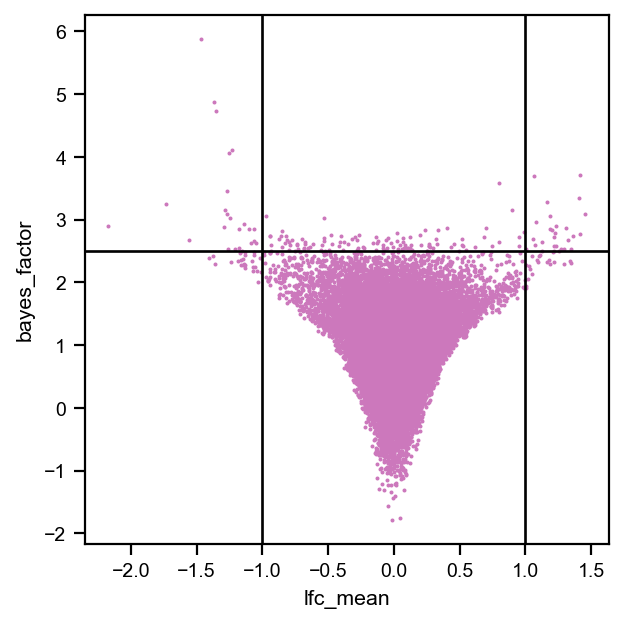

In [89]:
detected_genes_KO = {}
filtered_genes_KO = {}
for key, all_gene in all_genes_KO.items():
    print(key)
    if key == "Aire":
        color=cmap[1]
    else:
        color=cmap[4]
    subset_data = thymus_subset_data[thymus_subset_data.obs.genotype == f"{key}_KO"]
    detected_gene, filtered_gene = filter_scvi_de_genes(
        adata=subset_data,
        cell_type_key="lung_subset_annotations",
        expression_layer="scVI_normalized",
        df=all_gene,
        bayes_thresh=2.5,
        lfc_thresh=1,
        nonzero_thresh=0.05,
        percentile=0.99,
        peak_expression_thresh=0.5,
        color=color,
    )
    detected_genes_KO[key] = detected_gene
    filtered_genes_KO[key] = filtered_gene

In [90]:
for key, filtered_gene  in filtered_genes.items():
    KO_filtered = filtered_genes_KO[key.split("-")[0]]
    filtered_gene = filtered_gene[~filtered_gene.gene.isin(KO_filtered.gene)]

## Take intersection and average

In [91]:
averaged_genes = {}

for genotype in ["Fezf2"]:

    genotype_averaged = {}
    for cell_type in filtered_genes[f"{genotype}-1"].cell_type.unique():
        # Get sample data for genotype
        sample_1 = filtered_genes[f"{genotype}-1"].copy()
        sample_2 = filtered_genes[f"{genotype}-2"].copy()
        # Subset on current cell type
        sample_1 = sample_1[sample_1.cell_type == cell_type].sort_index()
        sample_2 = sample_2[sample_2.cell_type == cell_type].sort_index()
        # Subset on genes that are DE in both samples
        sample_1 = sample_1[sample_1.gene.isin(sample_2.gene)]
        sample_2 = sample_2[sample_2.gene.isin(sample_1.gene)]
        # Subset on genes that have same direction of effect in both samples
        mask = np.sign(sample_1["lfc_mean"]) == np.sign(sample_2["lfc_mean"])
        if sum(~mask) > 0:
            print(f"{genotype}-{cell_type}: {sum(~mask)} genes with discrepancies across samples")
        sample_1 = sample_1[mask]
        sample_2 = sample_2[mask]
        # Merge samples
        combined = pd.concat([sample_1, sample_2]).reset_index(drop=True)
        # Average stats across samples
        first_cols = ["gene", "cell_type", "comparison", 'group1', 'group2', "sample"]
        agg_dict = {}
        for column in combined.columns:
            if column in first_cols:
                agg_dict[column] = "first"
            else:
                agg_dict[column] = "mean"

        combined = combined.groupby("gene").agg(agg_dict)
        combined.index = combined.index + "_" + cell_type
        combined = combined.rename_axis(index={"gene": "gene_celltype"})
        genotype_averaged[cell_type] = combined
    # Combine all cell type DE dataframes for the current genotype
    averaged_genes[genotype] = pd.concat(genotype_averaged.values())

Fezf2-Div_ciliated: 1 genes with discrepancies across samples


In [100]:
len(averaged_genes["Fezf2"].gene.unique())

312

## Take max/min effect cell type for each gene

In [92]:
for genotype in ["Fezf2"]:
    genotype_data = averaged_genes[genotype]
    averaged_genes[f"{genotype}_max_LFC"] = genotype_data.loc[genotype_data.groupby("gene")["abs_lfc"].idxmax()]
    averaged_genes[f"{genotype}_min_LFC"] = genotype_data.loc[genotype_data.groupby("gene")["abs_lfc"].idxmin()]

## Volcanoplots

In [102]:
def volcanoplot(df, x, y, annotate_genes=None, save_path=None, annotate_genes_colors=None, *args, **kwargs):
    sns.scatterplot(
        data=df,
        x=x,
        y=y,
        linewidth=0.25,
        edgecolor="black",
        *args, **kwargs
    )
    for j,gene_list in enumerate(annotate_genes):
        if annotate_genes_colors is not None:
            color = annotate_genes_colors[j]
        else:
            color = "black"
        annotated_genes = df[df.gene.isin(gene_list)]
        texts = []
        for i, row in annotated_genes.iterrows():
            texts.append(
                plt.text(
                    row[x],
                    row[y],
                    row['gene'],
                    ha='center',
                    va='bottom',
                    fontsize=8, 
                    color=color,
                )
            )
        adjust_text(texts, arrowprops=dict(arrowstyle='-', color=color))
    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path)
    plt.show()

In [127]:
avg_de_genes[avg_de_genes.gene.isin(["Akap6", "Dpp4"])]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2,cell_type,gene,abs_lfc,expression_0.99
gene_celltype,,,,,,,,,,,,,,,,,,,,,
Akap6_Club_Goblet,0.9513,0.0487,3.099296,0.000011,0.000039,0.0,0.25,-1.743040,-1.780019,1.009539,...,0.094818,0.319466,0.5,WT vs Fezf2_KO,WT,Fezf2_KO,Club_Goblet,Akap6,1.743040,1.145100
Dpp4_Club_Goblet,0.9745,0.0255,3.736081,0.000026,0.000117,0.0,0.25,-2.099633,-2.083778,1.076027,...,0.266913,1.045672,1.0,WT vs Fezf2_KO,WT,Fezf2_KO,Club_Goblet,Dpp4,2.099633,3.245577
Akap6_Parabasal1,0.9647,0.0353,3.550655,0.000009,0.000034,0.0,0.25,-1.966210,-1.974086,1.071363,...,0.047475,0.314684,1.0,WT vs Fezf2_KO,WT,Fezf2_KO,Parabasal1,Akap6,1.966210,0.762028
Dpp4_Parabasal1,0.9711,0.0289,3.633490,0.000020,0.000083,0.0,0.25,-2.048455,-2.048516,1.049180,...,0.195817,0.869469,1.0,WT vs Fezf2_KO,WT,Fezf2_KO,Parabasal1,Dpp4,2.048455,2.320386
Dpp4_Parabasal3,0.9606,0.0394,3.194255,0.000037,0.000131,0.0,0.25,-1.817049,-1.843382,1.042689,...,0.457684,1.360261,1.0,WT vs Fezf2_KO,WT,Fezf2_KO,Parabasal3,Dpp4,1.817049,4.132025
Dpp4_Tuft1,0.9750,0.0250,3.704357,0.000014,0.000045,0.0,0.25,-1.467126,-1.318383,0.808716,...,0.077224,0.440379,1.0,WT vs Fezf2_KO,WT,Fezf2_KO,Tuft1,Dpp4,1.467126,0.821263
Dpp4_Neuroendocrine,0.9525,0.0475,3.031826,0.000033,0.000133,0.0,0.25,-1.845087,-1.820273,1.092777,...,0.178408,1.065195,1.0,WT vs Fezf2_KO,WT,Fezf2_KO,Neuroendocrine,Dpp4,1.845087,3.317800


Parabasal1


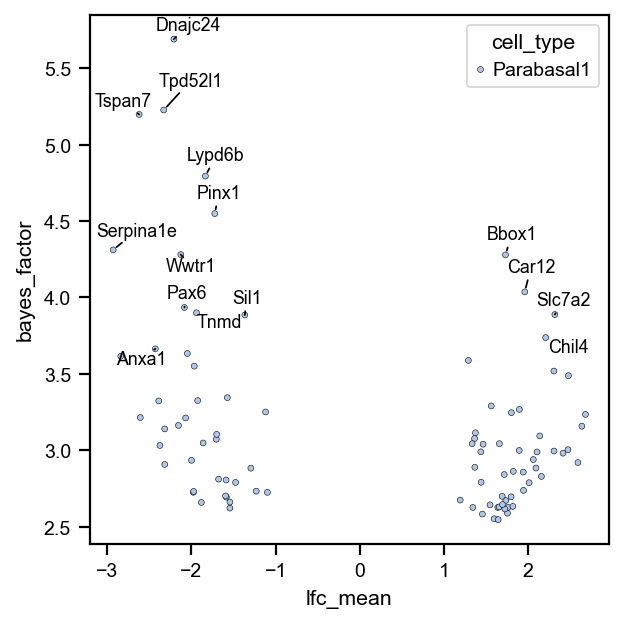

Parabasal2


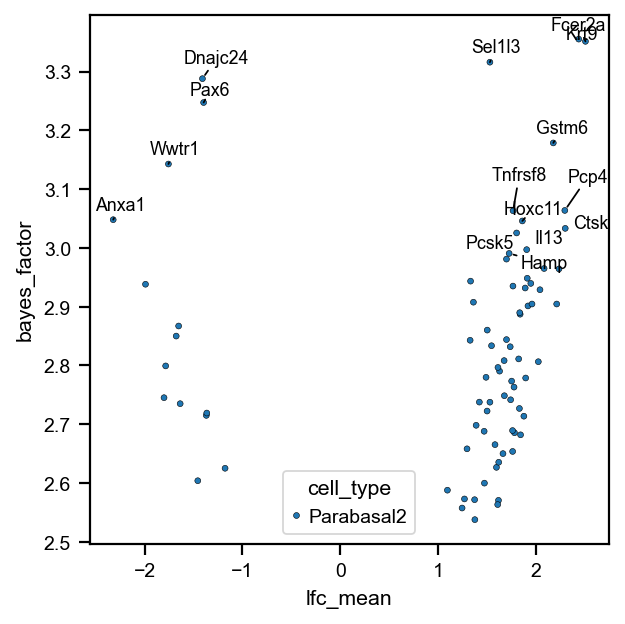

Parabasal3


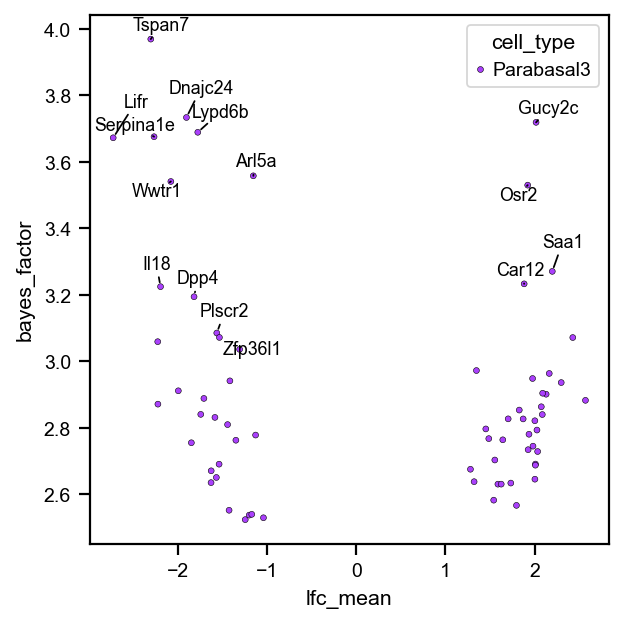

Club_Serous


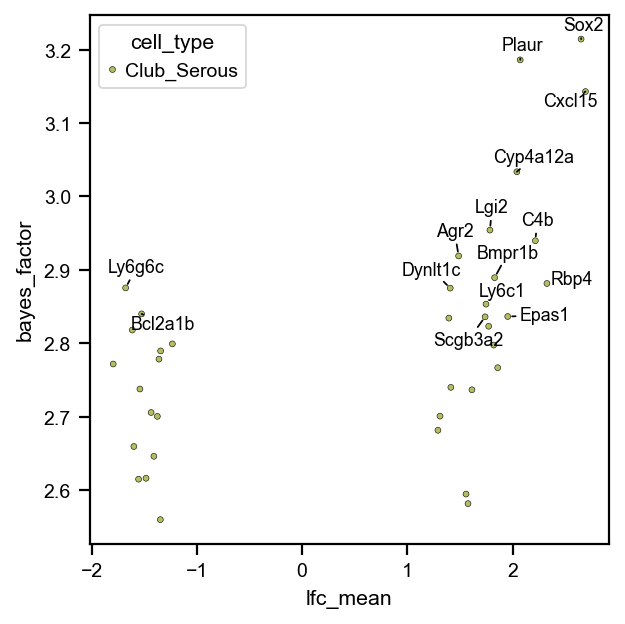

Club_Goblet


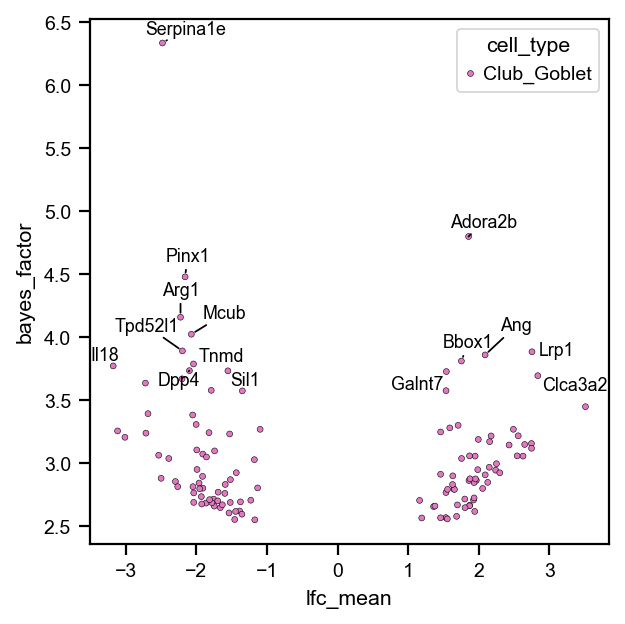

In [121]:
avg_de_genes = averaged_genes["Fezf2"]
colors = dict(zip(
    thymus_subset_data.obs.lung_subset_annotations.unique(),
    thymus_subset_data.uns['lung_subset_leiden_colors']
))

for cell_type in ["Parabasal1", "Parabasal2", "Parabasal3", "Club_Serous", "Club_Goblet"]:
    cell_type_de = avg_de_genes[avg_de_genes.cell_type == cell_type]
    gene_lists = [
        cell_type_de.sort_values(by="bayes_factor", ascending=False).head(15).gene
    ]
    print(cell_type)
    volcanoplot(
        df=cell_type_de,
        x="lfc_mean",
        y="bayes_factor",
        annotate_genes=gene_lists,
        annotate_genes_colors=["black"],
        s=7,
        hue="cell_type",
        palette=[colors[cell_type]],
        # save_path="../../analysis/genotype_DE/fezf2_de_genes.pdf"
    )

# Save data

In [64]:
if os.path.isdir(f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/all_lung_epithelial_cells"):
    shutil.rmtree(f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/all_lung_epithelial_cells")
    
all_lung_model.save(f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/all_lung_epithelial_cells")
all_lung.write(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/lung_epithelial_cells.h5ad")
thymus_subset_data.write(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/thymus_lung_epithelial_cell_subset.h5ad")

In [7]:
thymus_subset_data = sc.read(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/thymus_lung_epithelial_cell_subset.h5ad")